# Stryde Training - first-look data analysis for shot recordings

This notebook contains basic data visualization and analysis of the data collected with Stryde nodes at KAUST during the training week of Sept 24-28 2023.

The dataset is acquired as follows:

- <font color='blue'>Receivers</font>

    2 parallel lines with 41 planted nodes each, equally spaced by 5m for a total lenght of 200m (lines separated by 20m). 

    1 line of 7 buried receivers spaced 30m apart (along the first of the two previously mentioned parallel lines).

- <font color='red'>Sources</font>

    5 sources placed in between the two lines at points 2041, 2028, 2019, 2011, 2001 in order of shooting.

    10 shots per source starting at time:

    2041: 10:45
    2028: 10:51
    2019: 10:56
    2011: 11:00 
    2001: 11:06

In [17]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pylops
import matplotlib.pyplot as plt

from matplotlib.colors import SymLogNorm
from pylops.signalprocessing import FFT2D

from pystryde.reader import *
from pystryde.preproc import *
from pystryde.cmap import cmaps
from pystryde.visual import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Single shot

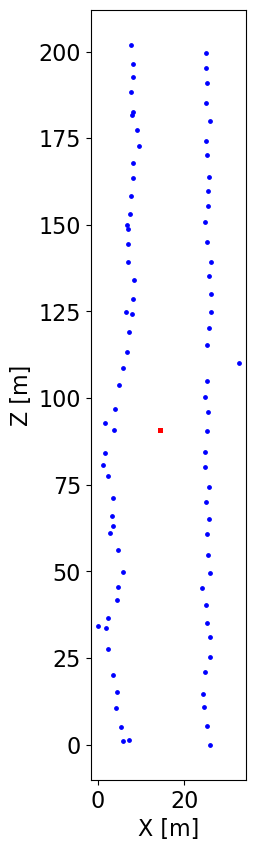

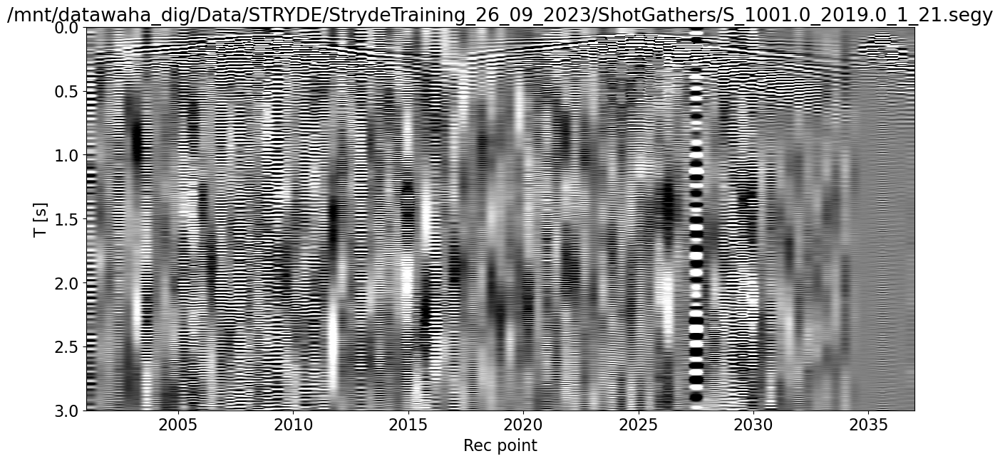

In [18]:
# SINGLE SHOT
filename = '/mnt/datawaha_dig/Data/STRYDE/StrydeTraining_26_09_2023/ShotGathers/S_1001.0_2019.0_1_21.segy'
#f = strydeshot(filename)
f = strydeshot(filename)
f.interpret()
f.getshot()

f.plotgeom(local=True, figsize=(2, 10))
plt.savefig('Figs/localgeometry.png', dpi=200)

f.plotshot(figsize=(15,7), itmax=1500, cmap='gray', clip=1e-3)
plt.savefig(f"Figs/{filename.split('/')[-1][:-5]}.png", dpi=200);

# Single stacked shot

This is obtained by stacking 10 repeated shots at the same location (alignment and stacking is done visually within Stryde SeismicQC software)

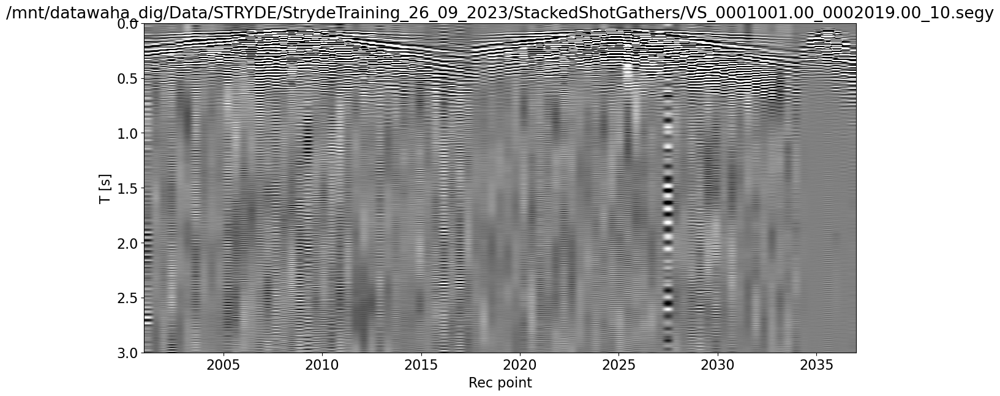

In [19]:
filenamestacked = '/mnt/datawaha_dig/Data/STRYDE/StrydeTraining_26_09_2023/StackedShotGathers/VS_0001001.00_0002019.00_10.segy' # 'StackedShotGathers/VS_0001001.00_0002001.00_10.segy'
f = strydeshot(filenamestacked)
f.interpret()
f.getshot()

f.plotshot(figsize=(15,7), itmax=1500, cmap='gray', clip=1e-3);
plt.savefig(f"Figs/{filenamestacked.split('/')[-1][:-5]}).png", dpi=200);

Let's now perform some basic filtering

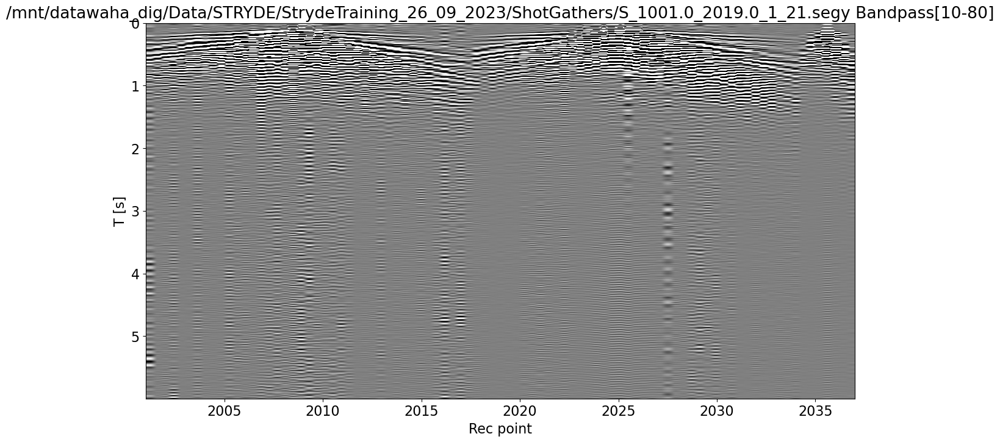

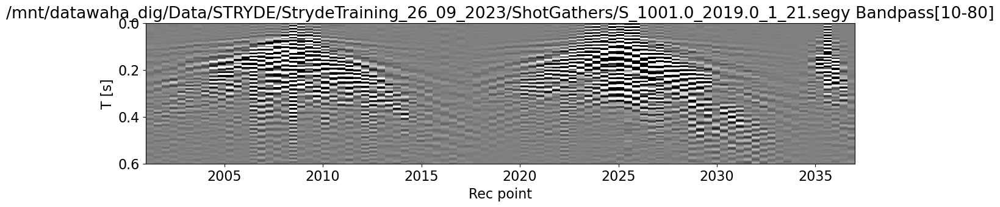

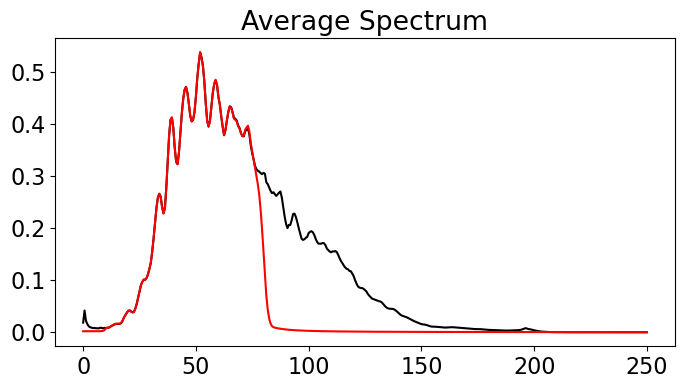

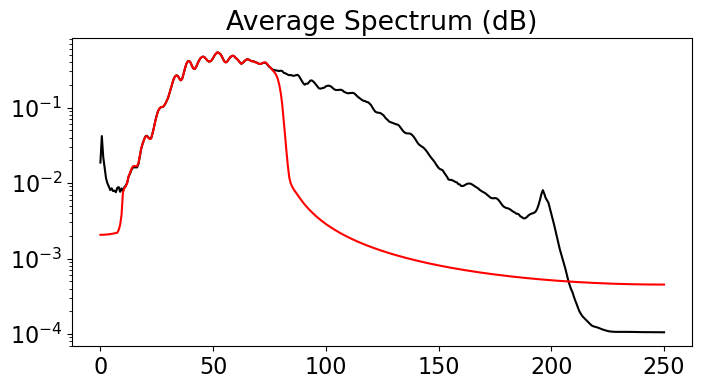

In [20]:
dfilt = f.filter(31, 10, 80, f.dt, plotflag=True, itmax_plot=1500, title=filename + ' Bandpass[10-80]',
                 cmap='gray', vmin=-1e-3, vmax=1e-3, figsize=(15, 8),
                 extent=(f.recpoint[0], f.recpoint[-1], f.t[-1], f.t[0]))
plt.savefig(f"Figs/{filenamestacked.split('/')[-1][:-5]}_filtered.png", dpi=200);

plt.figure(figsize=(15, 3))
plt.imshow(dfilt[:, :300].T, cmap='gray', vmin=-1e-2, vmax=1e-2, interpolation='none', 
           extent=(f.recpoint[0], f.recpoint[-1], f.t[300], f.t[0]))
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title(filename + ' Bandpass[10-80]')
plt.axis('tight')
plt.savefig(f"Figs/{filenamestacked.split('/')[-1][:-5]}_filtered_zoom.png", dpi=200)

D, freq = averagespectrum(f.data[:, :800].T, f.dt)
Dfilt, freq = averagespectrum(dfilt[:, :800].T, f.dt)

plt.figure(figsize=(8, 4))
plt.plot(freq, np.abs(D), 'k')
plt.plot(freq, np.abs(Dfilt), 'r')
plt.title('Average Spectrum')
plt.savefig(f"Figs/{filenamestacked.split('/')[-1][:-5]}_avspectrum.png", dpi=200)

plt.figure(figsize=(8, 4))
plt.semilogy(freq, np.abs(D), 'k')
plt.semilogy(freq, np.abs(Dfilt), 'r')
plt.title('Average Spectrum (dB)')
plt.savefig(f"Figs/{filenamestacked.split('/')[-1][:-5]}_avspectrumdb.png", dpi=200);

## Entire survey

Data shape: (10, 1, 5, 89, 3000)


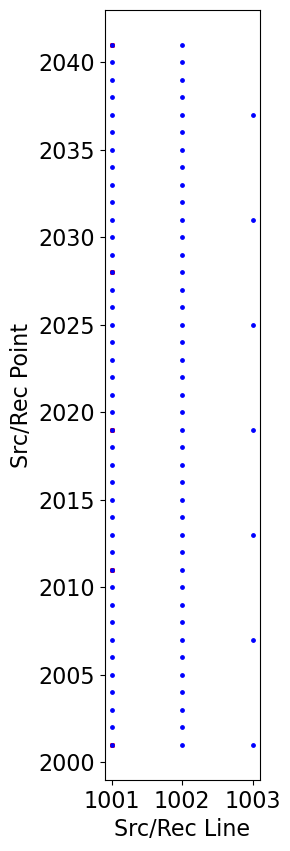

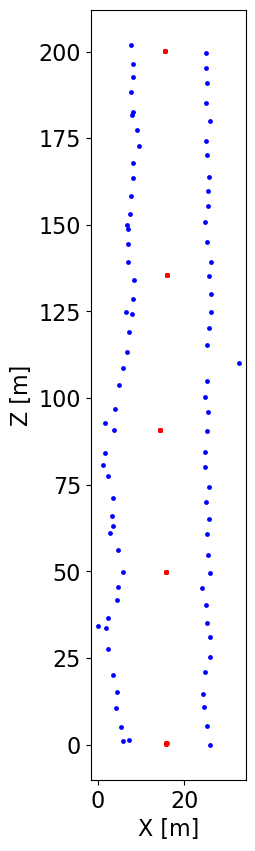

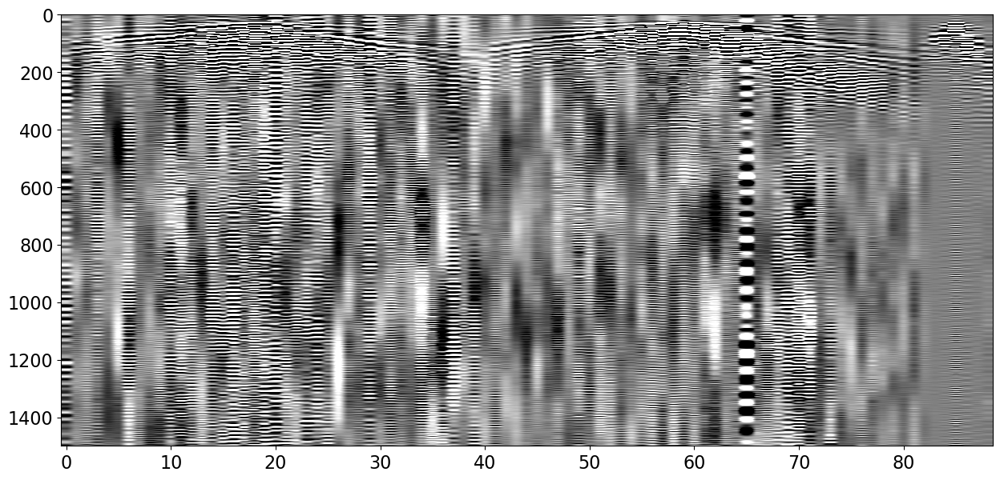

In [21]:
fs = strydeshots('/mnt/datawaha_dig/Data/STRYDE/StrydeTraining_26_09_2023/ShotGathers')
fs.interpret()
fs.getshot()

print('Data shape:', fs.data.shape)

fs.plotgeom(coords=False, figsize=(2, 10))
fs.plotgeom(local=True, figsize=(2, 10))
plt.savefig('Figs/localsurveygeometry.png', dpi=200)

plt.figure(figsize=(15,7))
plt.imshow(fs.data[0, 0, 2, :, :1500].T, cmap='gray', vmin=-1e-3, vmax=1e-3)
plt.axis('tight');

### Improve data alignment via cross-correlation

Let's start with a single shot location. We will use the traces at the closest receiver to find the best alignment

Indices of max aligment: [89 90 90 89 89 90 89 89 90]
Indices of max aligment after shifts: [89 89 89 89 89 89 89 89 89]


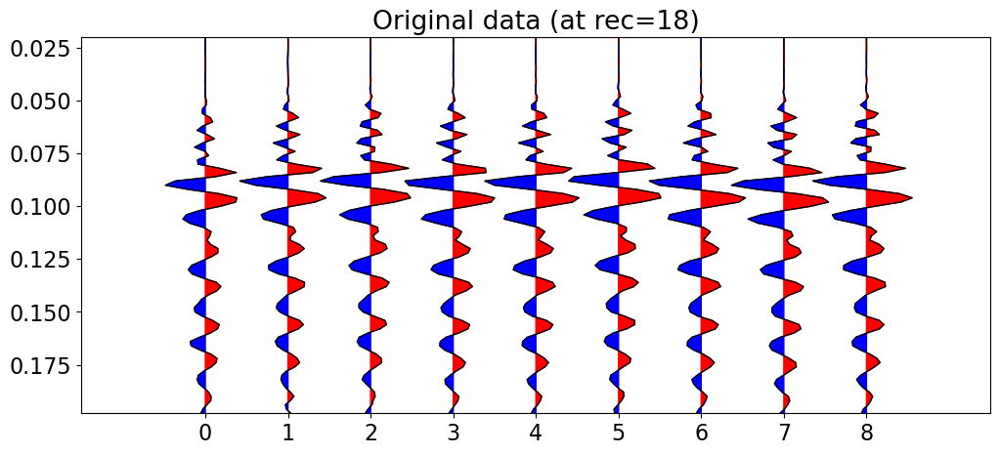

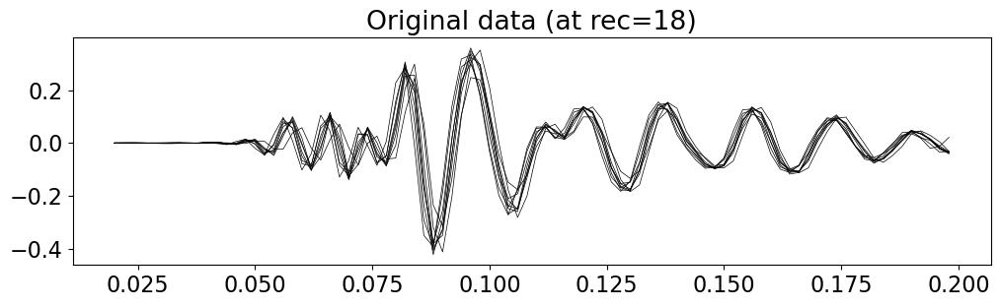

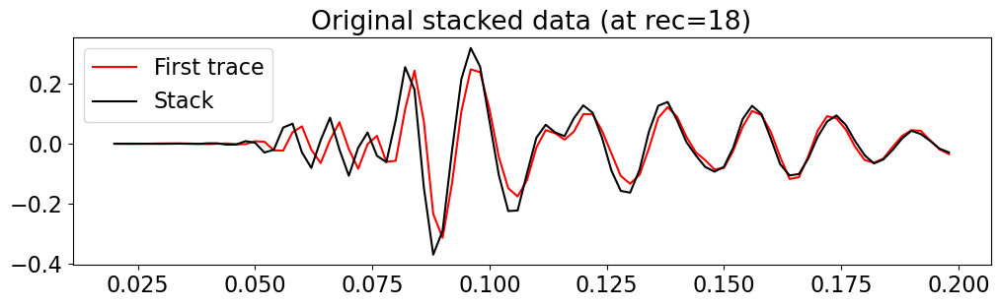

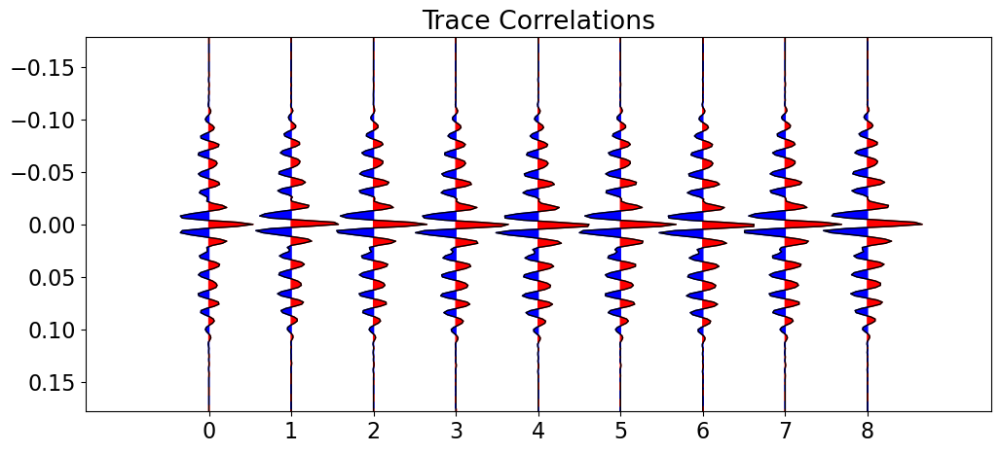

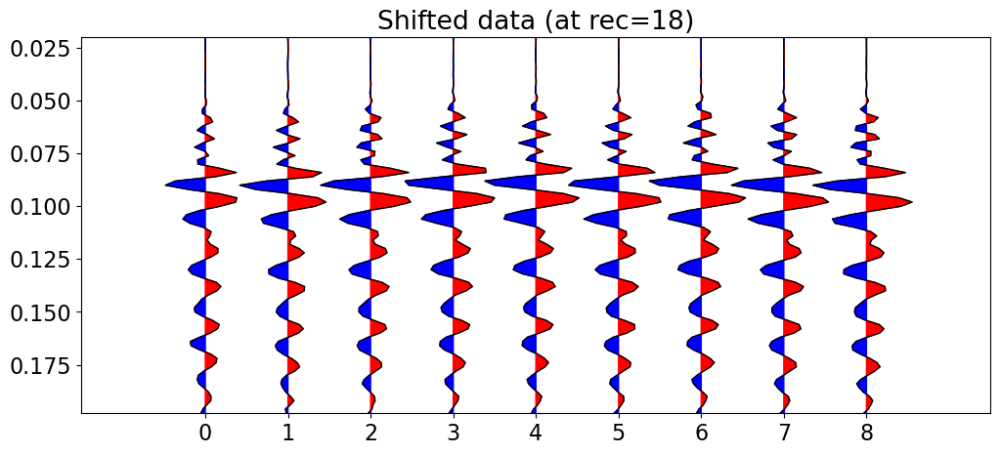

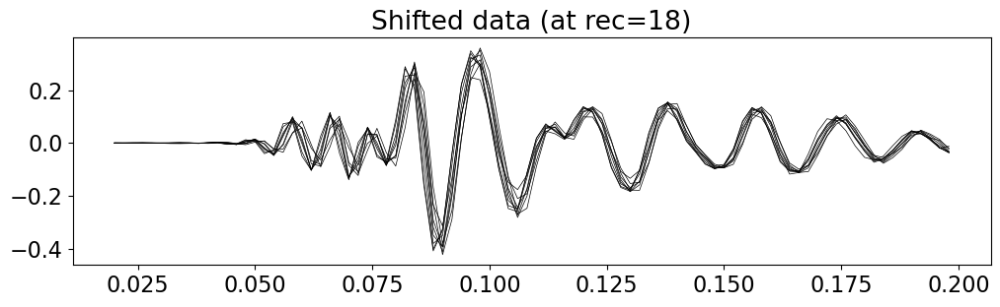

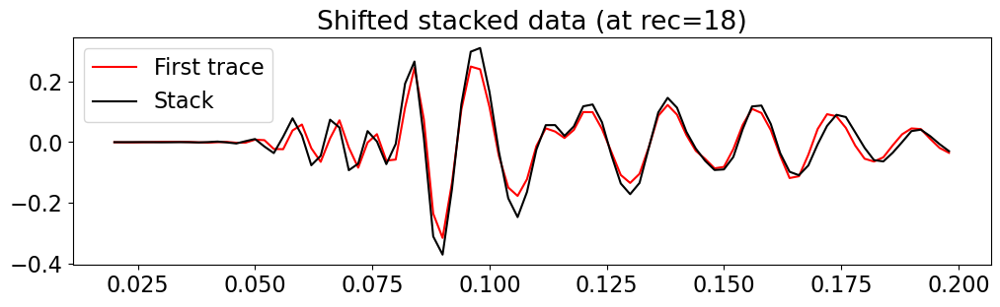

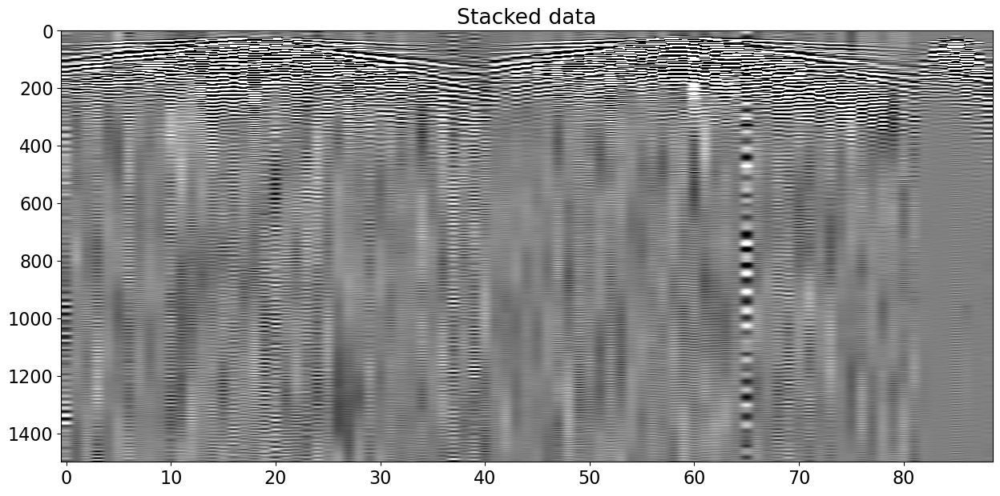

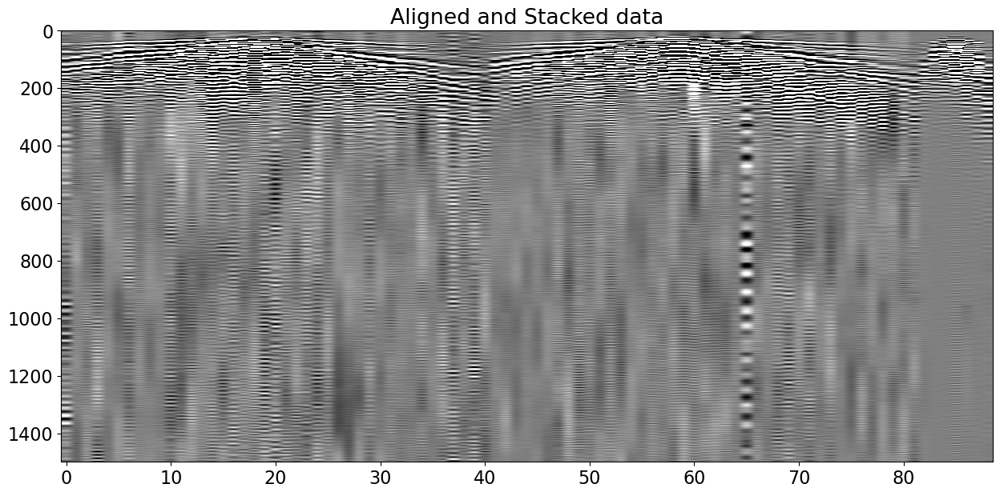

In [22]:
ishot = 2
data = fs.data[1:]
datashift, figs = aligndata(data[:, 0, ishot], np.where(fs.recpoint == fs.srcpoint_axis[ishot])[0][0], fs.t, tlims=(10, 100), plotflag=True)
figs[0].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgoriginal.png", dpi=200)
figs[1].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgoriginal_traceoverlay.png", dpi=200)
figs[2].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgoriginal_traceoverlay1.png", dpi=200)
figs[3].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrs.png", dpi=200)
figs[4].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrected.png", dpi=200)
figs[5].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrected_traceoverlay.png", dpi=200)
figs[6].savefig(f"Figs/{filename.split('/')[-1][:-5]}_crgcorrected_traceoverlay1.png", dpi=200)

plt.figure(figsize=(15,7))
plt.imshow(np.mean(data[:, 0, ishot, :, :1500], axis=0).T, cmap='gray', vmin=-1e-3, vmax=1e-3)
plt.axis('tight')
plt.title('Stacked data')
plt.savefig(f"Figs/{filename.split('/')[-1][:-5]}_stacked.png", dpi=200)

plt.figure(figsize=(15,7))
plt.imshow(np.mean(datashift[:, :, :1500], axis=0).T, cmap='gray', vmin=-1e-3, vmax=1e-3)
plt.axis('tight')
plt.title('Aligned and Stacked data')
plt.savefig(f"Figs/{filename.split('/')[-1][:-5]}_alignstacked.png", dpi=200)

Let's then do the same for all shots

In [23]:
datashift = np.zeros_like(data)

for ishot in range(len(fs.srcpoint_axis)):
    print(f'Working with shot {ishot}')
    datashift[:, 0, ishot] = aligndata(data[:, 0, ishot], 
                                       np.where(fs.recpoint == fs.srcpoint_axis[ishot])[0][0], 
                                       fs.t, tlims=(10, 100), plotflag=False)[0]
    
datashiftstacked = np.mean(datashift.squeeze(), axis=0)

Working with shot 0
Indices of max aligment: [89 88 89 89 88 91 89 90 90]
Indices of max aligment after shifts: [89 89 89 89 89 89 89 89 89]
Working with shot 1
Indices of max aligment: [89 89 89 89 89 89 89 89 89]
Indices of max aligment after shifts: [89 89 89 89 89 89 89 89 89]
Working with shot 2
Indices of max aligment: [89 90 90 89 89 90 89 89 90]
Indices of max aligment after shifts: [89 89 89 89 89 89 89 89 89]
Working with shot 3
Indices of max aligment: [89 89 89 88 90 89 89 89 89]
Indices of max aligment after shifts: [89 89 89 89 89 89 89 89 89]
Working with shot 4
Indices of max aligment: [89 89 89 89 89 89 89 89 89]
Indices of max aligment after shifts: [89 89 89 89 89 89 89 89 89]


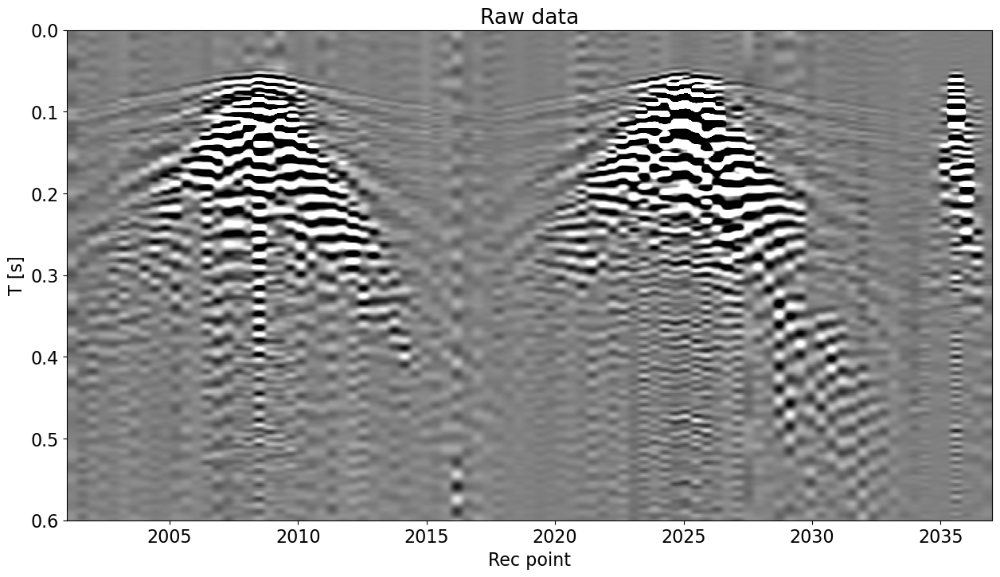

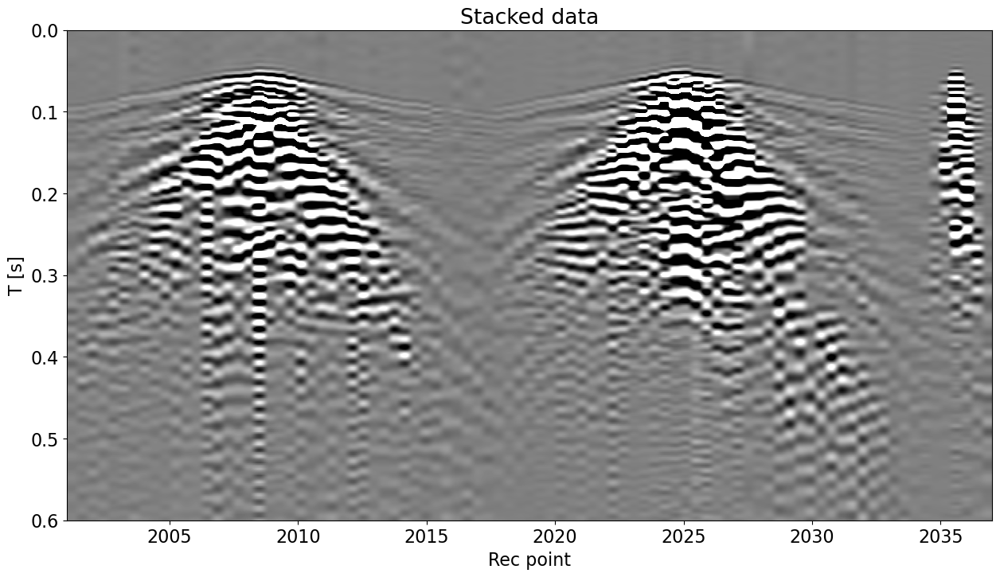

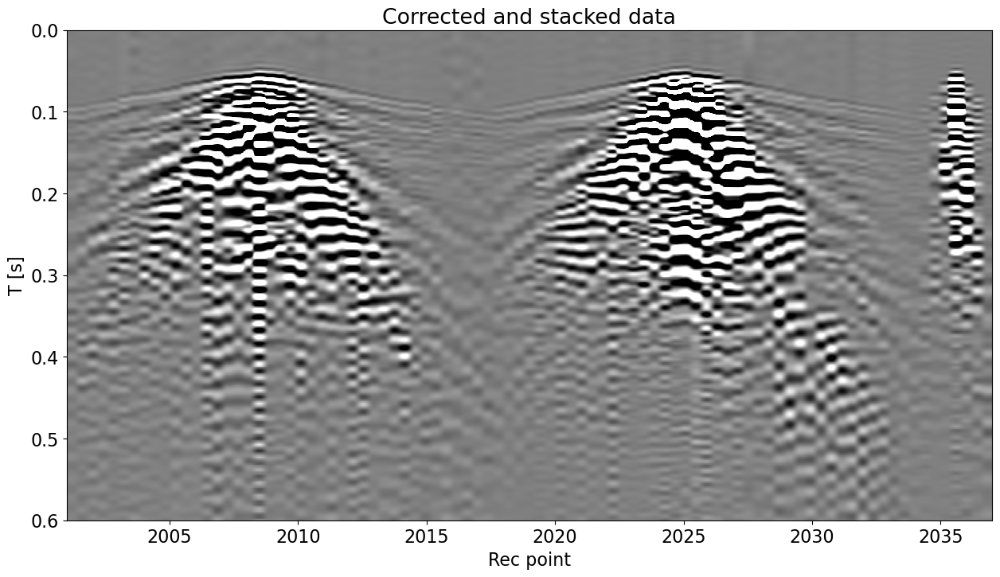

In [24]:
ishot = 2
itmax = 300

plt.figure(figsize=(15, 8))
plt.imshow(data[0, 0, ishot, :, :itmax].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(f.recpoint[0], f.recpoint[-1], f.t[itmax], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Raw data')
plt.savefig(f"Figs/Rawdata_shot{ishot}.png", dpi=200)

plt.figure(figsize=(15, 8))
plt.imshow(np.mean(data[:, 0, ishot, :, :itmax], axis=0).T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(f.recpoint[0], f.recpoint[-1], f.t[itmax], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Stacked data')
plt.savefig(f"Figs/Stackeddata_shot{ishot}.png", dpi=200)

plt.figure(figsize=(15, 8))
plt.imshow(datashiftstacked[ishot, :, :itmax].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
           extent=(f.recpoint[0], f.recpoint[-1], f.t[itmax], f.t[0]))
plt.axis('tight')
plt.xlabel('Rec point')
plt.ylabel('T [s]')
plt.title('Corrected and stacked data')
plt.savefig(f"Figs/OptimalStackeddata_shot{ishot}.png", dpi=200);

### FK spectra

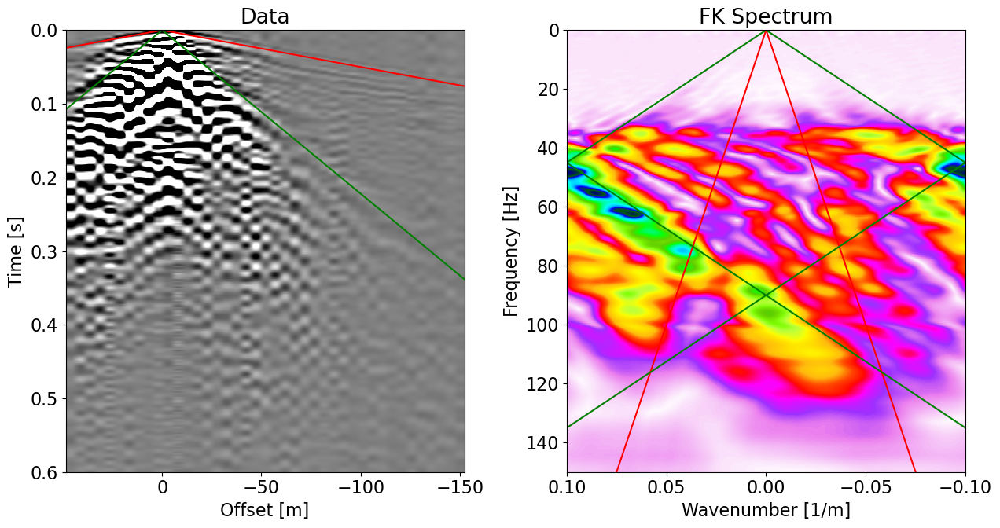

In [25]:
ishot = 1
itmax = 300
nfft = 2**10
toff = 0.1

nr_line = len(np.where(fs.recline == fs.recline[0])[0])
offset = (fs.srcy[np.where(fs.srcpoint == fs.srcpoint_axis[ishot])[0][0]] - fs.recy[:nr_line]) * fs.sc

# direct arrival
vdir = 2000
tdir = np.abs(offset)/vdir

# ground rool arrival
vgr = 450
tgr = np.abs(offset)/vgr

# fft 
FFTop = FFT2D(dims=[nr_line, itmax], nffts=[nfft, nfft],
              sampling=[5, fs.dt], real=True)

# raw data
Dfk = FFTop @ datashiftstacked[ishot, :nr_line, :itmax]

fig, axs = plt.subplots(1, 2, figsize=(13, 7))
axs[0].imshow(datashiftstacked[ishot, :nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
              extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[0].plot(offset, tdir, 'r')
axs[0].plot(offset, tgr, 'g')
axs[0].axis('tight')
axs[0].set_title('Data')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')
axs[0].set_ylim(fs.t[itmax], fs.t[0])
axs[1].imshow(np.fft.fftshift(np.abs(Dfk), axes=0).T, cmap='gist_ncar_r',
              extent=(-FFTop.f1[nfft//2], FFTop.f1[nfft//2], FFTop.f2[-1], FFTop.f2[0]))
axs[1].plot(FFTop.f2/vdir, FFTop.f2, 'r'), axs[1].plot(-FFTop.f2/vdir, FFTop.f2, 'r')
axs[1].plot(FFTop.f2/vgr, FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr, FFTop.f2, 'g')
for ireplica in range(1, 2):
    axs[1].plot(FFTop.f2/vgr + 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr - 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g') 
axs[1].axis('tight')
axs[1].set_xlim(-FFTop.f1[nfft//2], FFTop.f1[nfft//2])
axs[1].set_ylim(150, FFTop.f2[0])
axs[1].set_title('FK Spectrum')
axs[1].set_xlabel('Wavenumber [1/m]')
axs[1].set_ylabel('Frequency [Hz]')
plt.tight_layout()
plt.savefig(f"Figs/FKspectra_shot{ishot}.png", dpi=200);

Let's now design the geometry (i.e., spatial sampling) which would avoid this aliasing

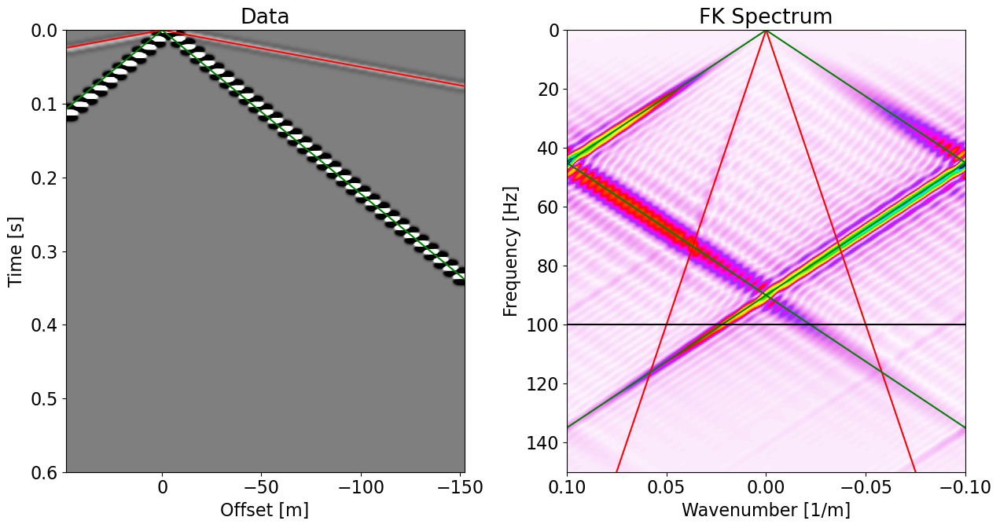

In [26]:
# Current sampling
par = {"ox": -50, "dx": 5, "nx": nr_line,
       "ot": 0,  "dt": fs.dt, "nt": itmax, "f0": 60,
}

t, t2, x, y = pylops.utils.seismicevents.makeaxis(par)
wav = pylops.utils.wavelets.ricker(np.arange(41) * par["dt"], f0=par["f0"])[0]

t0 = [0., 0.]
theta = [90, -90]
ampdir = [5e-3, 5e-3]
ampgr = [1e-1, 1e-1]
dana = pylops.utils.seismicevents.linear2d(x, t, vdir, t0, theta, ampdir, wav)[1] + \
    pylops.utils.seismicevents.linear2d(x, t, vgr, t0, theta, ampgr, wav)[1]

fmax = 100
FFTop = FFT2D(dims=[par['nx'], itmax], nffts=[nfft, nfft],
              sampling=[5, fs.dt], real=True)

Dfk = FFTop @ dana

fig, axs = plt.subplots(1, 2, figsize=(13, 7))
axs[0].imshow(dana.T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
              extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[0].plot(offset, tdir, 'r')
axs[0].plot(offset, tgr, 'g')
axs[0].axis('tight')
axs[0].set_title('Data')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')
axs[0].set_ylim(fs.t[itmax], fs.t[0])
axs[1].imshow(np.fft.fftshift(np.abs(Dfk), axes=0).T, cmap='gist_ncar_r',
              extent=(-FFTop.f1[nfft//2], FFTop.f1[nfft//2], FFTop.f2[-1], FFTop.f2[0]))
axs[1].plot(FFTop.f2/vdir, FFTop.f2, 'r'), axs[1].plot(-FFTop.f2/vdir, FFTop.f2, 'r')
axs[1].plot(FFTop.f2/vgr, FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr, FFTop.f2, 'g')
for ireplica in range(1, 2):
    axs[1].plot(FFTop.f2/vgr + 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr - 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g') 
axs[1].axhline(fmax, color='k')
axs[1].axis('tight')
axs[1].set_xlim(-FFTop.f1[nfft//2], FFTop.f1[nfft//2])
axs[1].set_ylim(150, FFTop.f2[0])
axs[1].set_title('FK Spectrum')
axs[1].set_xlabel('Wavenumber [1/m]')
axs[1].set_ylabel('Frequency [Hz]')
plt.tight_layout()
plt.savefig(f"Figs/FKspectrasynth_shot{ishot}.png", dpi=200);

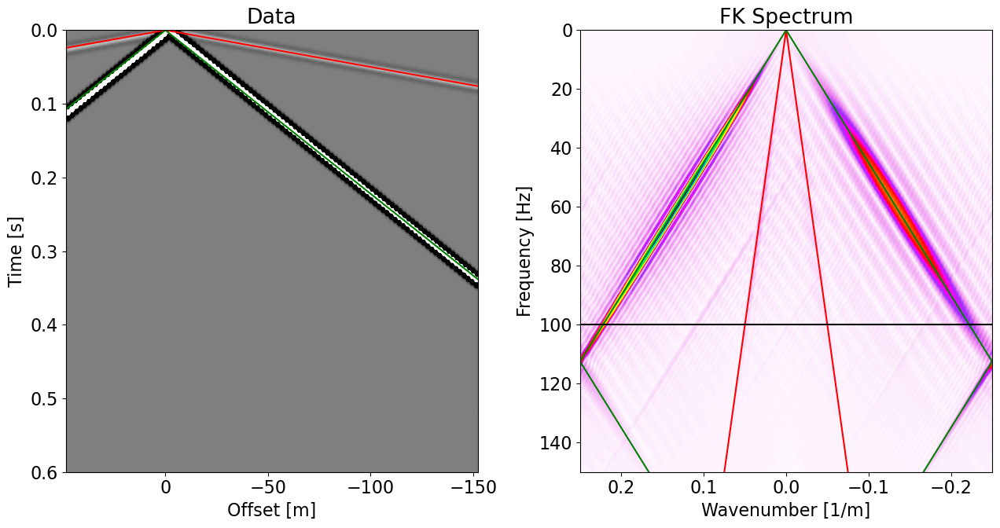

In [27]:
# Unalised sampling
par = {"ox": -50, "dx": 2, "nx": int(nr_line*5/2),
       "ot": 0,  "dt": fs.dt, "nt": itmax, "f0": 60,
}

t, t2, x, y = pylops.utils.seismicevents.makeaxis(par)

dana = pylops.utils.seismicevents.linear2d(x, t, vdir, t0, theta, ampdir, wav)[1] + \
    pylops.utils.seismicevents.linear2d(x, t, vgr, t0, theta, ampgr, wav)[1]

FFTop = FFT2D(dims=[par['nx'], itmax], nffts=[nfft, nfft],
              sampling=[2, fs.dt], real=True)

Dfk = FFTop @ dana

fig, axs = plt.subplots(1, 2, figsize=(13, 7))
axs[0].imshow(dana.T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
              extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[0].plot(offset, tdir, 'r')
axs[0].plot(offset, tgr, 'g')
axs[0].axis('tight')
axs[0].set_title('Data')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')
axs[0].set_ylim(fs.t[itmax], fs.t[0])
axs[1].imshow(np.fft.fftshift(np.abs(Dfk), axes=0).T, cmap='gist_ncar_r',
              extent=(-FFTop.f1[nfft//2], FFTop.f1[nfft//2], FFTop.f2[-1], FFTop.f2[0]))
axs[1].plot(FFTop.f2/vdir, FFTop.f2, 'r'), axs[1].plot(-FFTop.f2/vdir, FFTop.f2, 'r')
axs[1].plot(FFTop.f2/vgr, FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr, FFTop.f2, 'g')
for ireplica in range(1, 2):
    axs[1].plot(FFTop.f2/vgr + 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g'), axs[1].plot(-FFTop.f2/vgr - 2*ireplica*FFTop.f1[nfft//2], FFTop.f2, 'g') 
axs[1].axhline(fmax, color='k')
axs[1].axis('tight')
axs[1].set_xlim(-FFTop.f1[nfft//2], FFTop.f1[nfft//2])
axs[1].set_ylim(150, FFTop.f2[0])
axs[1].set_title('FK Spectrum')
axs[1].set_xlabel('Wavenumber [1/m]')
axs[1].set_ylabel('Frequency [Hz]')
plt.tight_layout()
plt.savefig(f"Figs/FKspectrasynthfine_shot{ishot}.png", dpi=200);

## Dispersion panels

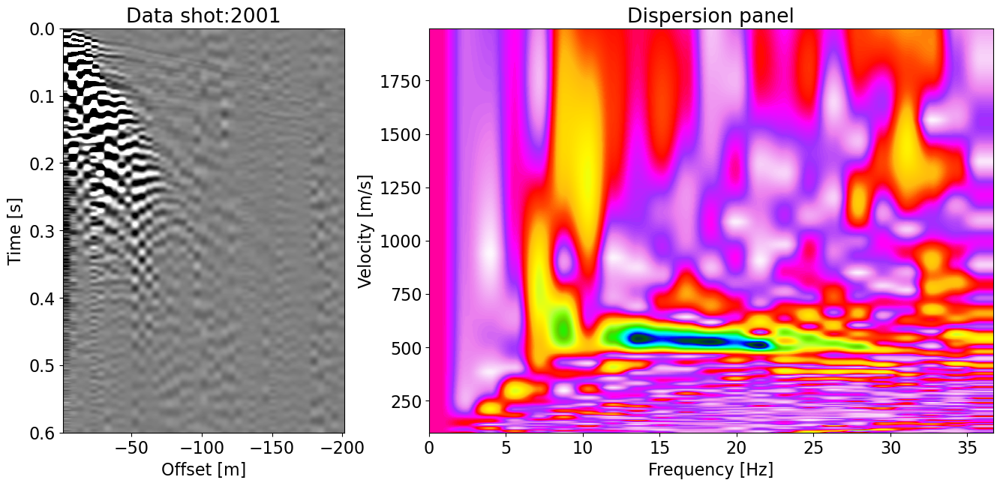

In [28]:
ishot = 0
vgr = 500
toff = 0.1

offset = (fs.srcy[np.where(fs.srcpoint == fs.srcpoint_axis[ishot])[0][0]] - fs.recy[:nr_line]) * fs.sc
tgr = np.abs(offset)/vgr

faxis, caxis, dispspectra = parkdispersion(datashiftstacked[ishot, :nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)], 5, fs.dt, 100, 2000, 5, 40)

fig, axs = plt.subplots(1, 2, figsize=(16, 7), gridspec_kw={'width_ratios': [1, 2]})
axs[0].imshow(datashiftstacked[ishot, :nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)].T, cmap='gray', vmin=-1e-2, vmax=1e-2, 
              extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[0].axis('tight')
axs[0].set_title(f'Data shot:{fs.srcpoint_axis[ishot]:.0f}')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')
axs[0].set_ylim(fs.t[itmax], fs.t[0])
axs[1].imshow(dispspectra,cmap='gist_ncar_r', origin='lower', extent=(faxis[0], faxis[-1], caxis[0], caxis[-1]))
axs[1].axis('tight')
axs[1].set_ylabel('Velocity [m/s]')
axs[1].set_xlabel('Frequency [Hz]')
axs[1].set_title('Dispersion panel')
plt.savefig(f"Figs/Dispersion_shot{fs.srcpoint_axis[ishot]}.png", dpi=200);

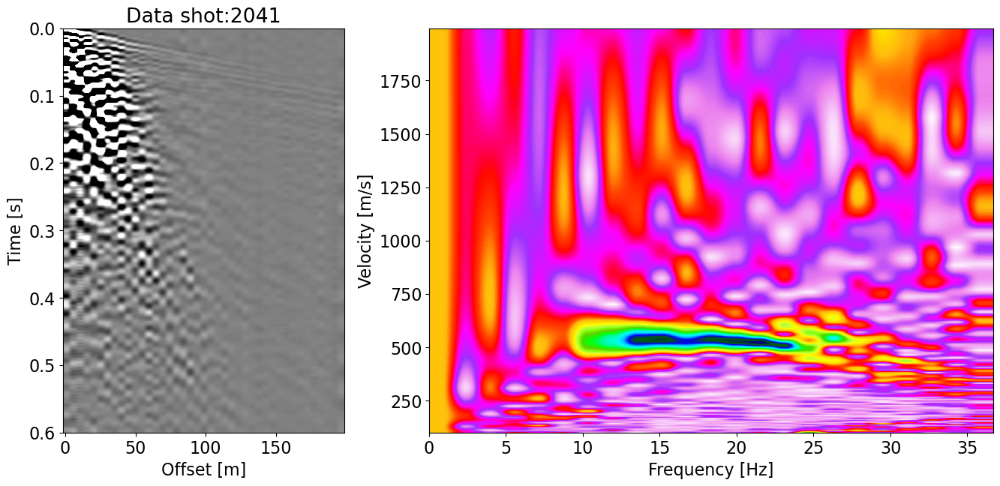

In [29]:
ishot = -1
vgr = 500
toff = 0.04

offset = (fs.srcy[np.where(fs.srcpoint == fs.srcpoint_axis[ishot])[0][0]] - fs.recy[:nr_line]) * fs.sc
tgr = np.abs(offset)/vgr

faxis, caxis, dispspectra = parkdispersion(np.fliplr(datashiftstacked[ishot, :nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)]), 5, fs.dt, 100, 2000, 5, 40)

fig, axs = plt.subplots(1, 2, figsize=(16, 7), gridspec_kw={'width_ratios': [1, 2]})
axs[0].imshow(np.fliplr(datashiftstacked[ishot, :nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)].T), cmap='gray', vmin=-1e-2, vmax=1e-2, 
              extent=(offset[-1], offset[0], fs.t[itmax], fs.t[0]))
axs[0].axis('tight')
axs[0].set_title(f'Data shot:{fs.srcpoint_axis[ishot]:.0f}')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')
axs[0].set_ylim(fs.t[itmax], fs.t[0])
axs[1].imshow(dispspectra,cmap='gist_ncar_r', origin='lower', extent=(faxis[0], faxis[-1], caxis[0], caxis[-1]))
axs[1].axis('tight')
axs[1].set_ylabel('Velocity [m/s]')
axs[1].set_xlabel('Frequency [Hz]')
plt.savefig(f"Figs/Dispersion_shot{fs.srcpoint_axis[ishot]}.png", dpi=200);

## First breaks

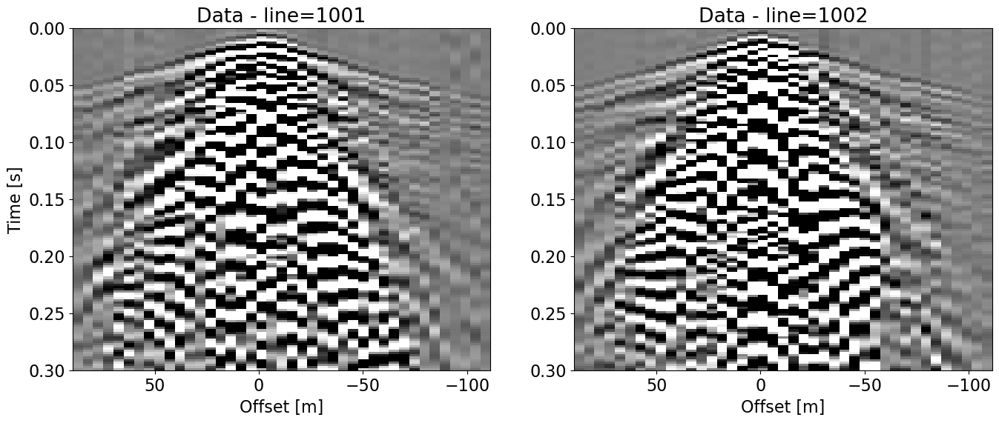

In [30]:
ishot = 2
itmax = 150
toff = 0.04

offset = (fs.srcy[np.where(fs.srcpoint == fs.srcpoint_axis[ishot])[0][0]] - fs.recy[:nr_line]) * fs.sc

fig, axs = plt.subplots(1, 2, figsize=(16, 6))
axs[0].imshow(datashiftstacked[ishot, :nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)].T, cmap='gray', vmin=-5e-3, vmax=5e-3, 
          extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[0].axis('tight')
axs[0].set_title('Data - line=1001')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')

axs[1].imshow(datashiftstacked[ishot, nr_line:2*nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)].T, cmap='gray', vmin=-5e-3, vmax=5e-3, 
          extent=(offset[0], offset[-1], fs.t[itmax], fs.t[0]))
axs[1].axis('tight')
axs[1].set_title('Data - line=1002')
axs[1].set_xlabel('Offset [m]')
plt.savefig(f"Figs/Dispersion_shot{fs.srcpoint_axis[ishot]}.png", dpi=200);

## Buried vs surface receiver comparison

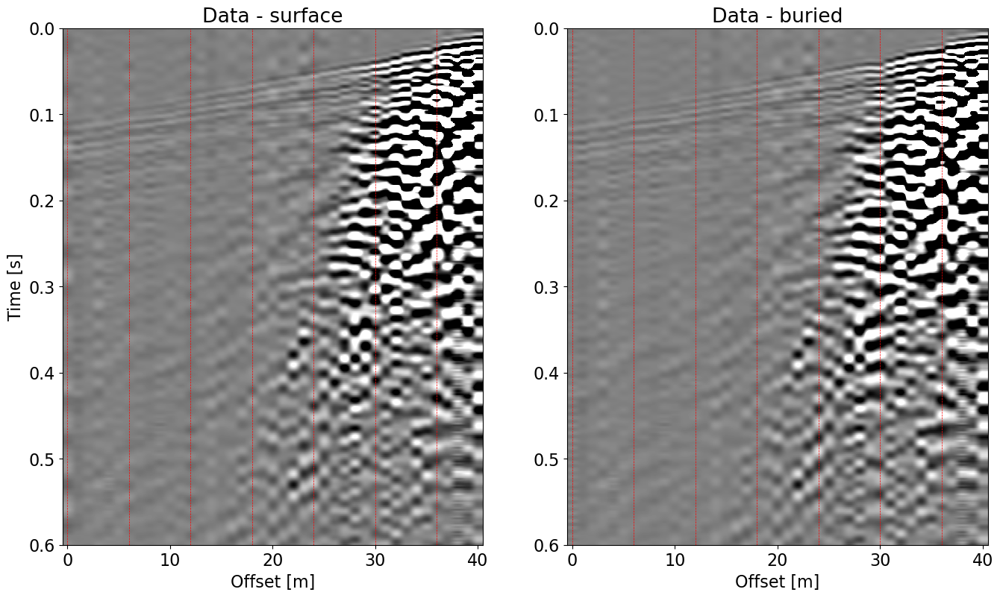

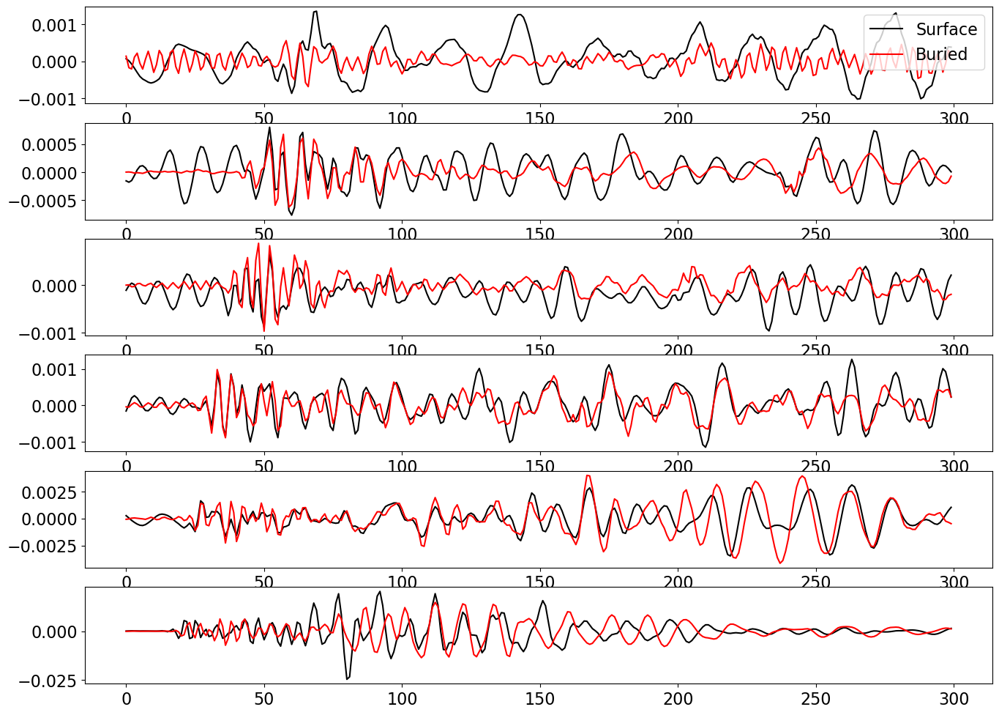

In [31]:
ishot = 4
itmax = 300
toff = 0.02

dsurface = datashiftstacked[ishot, :nr_line, int(toff/fs.dt):itmax+int(toff/fs.dt)]
dburied = dsurface.copy()
dburied[:42:6] = datashiftstacked[ishot, 2*nr_line:, int(toff/fs.dt):itmax+int(toff/fs.dt)]

fig, axs = plt.subplots(1, 2, figsize=(16, 9))
axs[0].imshow(dsurface.T, cmap='gray', vmin=-5e-3, vmax=5e-3, extent=(-0.5, nr_line - 0.5, fs.t[itmax], fs.t[0]))
axs[0].axis('tight')
axs[0].set_title('Data - surface')
axs[0].set_xlabel('Offset [m]')
axs[0].set_ylabel('Time [s]')

axs[1].imshow(dburied.T, cmap='gray', vmin=-5e-3, vmax=5e-3, extent=(-0.5, nr_line - 0.5, fs.t[itmax], fs.t[0]))
axs[1].axis('tight')
axs[1].set_title('Data - buried')
axs[1].set_xlabel('Offset [m]')

for itrace in range(0, 42, 6):
    axs[0].axvline(itrace, color='r', linestyle='--', lw=0.5)
    axs[1].axvline(itrace, color='r', linestyle='--', lw=0.5)
plt.savefig(f"Figs/Surface_vs_buried_shot{fs.srcpoint_axis[ishot]}.png", dpi=200);

fig, axs = plt.subplots(6, 1, figsize=(16, 12))
for iax, ax in enumerate(axs):
    if iax == 0:
        ax.plot(dsurface[iax*6], 'k', label='Surface')
        ax.plot(dburied[iax*6], 'r', label='Buried')
        ax.legend()
    else:
        ax.plot(dsurface[iax*6], 'k')
        ax.plot(dburied[iax*6], 'r')

plt.savefig(f"Figs/Surface_vs_buried_traces_shot{fs.srcpoint_axis[ishot]}.png", dpi=200);

## Alternative colorbars

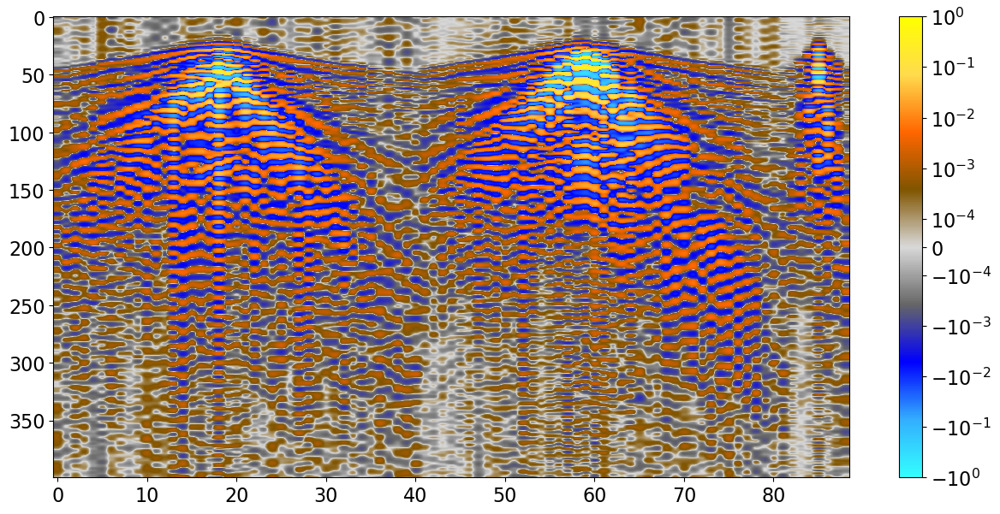

In [32]:
plt.figure(figsize=(15,7))
plt.imshow(f.data[:, :400].T, cmap=cmaps['amplitudepkdsg'], 
           norm=SymLogNorm(linthresh=1e-4, linscale=0.5, vmin=-1e0, vmax=1e0, base=10))
plt.axis('tight')
plt.colorbar();